## Spatial variable isoform usage in the Xenium Prime 5K mouse brain dataset

In [1]:
import os
import pickle
import numpy as np
import pandas as pd
import itertools

import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

In [2]:
project_dir = "/Users/jysumac/Projects/SPLISOSM_paper"
data_dir = "/Users/jysumac/Projects/SPLISOSM_paper/data/xenium_5k_mouse_brain/"
res_dir = "/Users/jysumac/Projects/SPLISOSM_paper/results/xenium_5k_mouse_brain/"

for _dir in [res_dir, f"{res_dir}/sv_results", f"{res_dir}/figures"]:
    if not os.path.exists(_dir):
        os.makedirs(_dir)

### Load data

#### Load Xenium annotations

In [3]:
# Xenium 5K probe gene annotations
df_gene_meta = pd.read_csv(
    f"{data_dir}/XeniumPrimeMouse5Kpan_tissue_pathways_metadata.csv"
).set_index('gene_name')

# Xenium probe BED12 file
bed_xenium = pd.read_csv(
    f"{data_dir}/xenium_mouse_5K_gene_expression_panel_probe_locations.bed",
    sep='\t',
    skiprows=1,
    header=None,
    names=['chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand',
           'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes',
           'blockStarts', 'description'],
    index_col=False
)

#### Load per-codeword density maps

In [4]:
pickle_file_path = f"{data_dir}/density_maps/all_multi_codeword_genes.pkl"

# Load the dictionary of density maps from the pickle file
with open(pickle_file_path, "rb") as f:
    cw_density_dict = pickle.load(f)

# Process the data to map genes to their corresponding codewords
gene_cwid_dict = {}
if cw_density_dict:
    codeword_lists = list(cw_density_dict.keys())
    for codeword in codeword_lists:
        # Assumes format 'GeneName-CodewordID'
        gene = codeword.split('-')[0]
        if gene not in gene_cwid_dict:
            gene_cwid_dict[gene] = []
        gene_cwid_dict[gene].append(codeword)

# Filter for genes that have more than one codeword, as these are the
# only ones for which a log ratio plot is meaningful.
genes_with_multiple_codewords = sorted([
    gene for gene, codewords in gene_cwid_dict.items() if len(codewords) > 1
])

print(f"Found {len(genes_with_multiple_codewords)} genes with multiple codewords available for comparison.")

Found 4993 genes with multiple codewords available for comparison.


#### Load Xenium SV test results

In [5]:
df_sv_pval = pd.read_csv(f"{res_dir}/sv_results/all_multi_codeword_genes_0808.csv", index_col=0)
df_sv_pval.head()

,gene_id,num_codewords,num_probesets,protein_name,location,cell_type,cellchat_pathway,pvalue_hsic-ir,padj_hsic-ir,pvalue_hsic-ic,padj_hsic-ic,pvalue_hsic-gc,padj_hsic-gc
gene,,,,,,,,,,,,,
Bmp2,ENSMUSG00000027358,2.0,2.0,Bone morphogenetic protein 2 (BMP-2) (Bone mor...,Secreted,endothelial cell of lymphatic vessel;endotheli...,NaN,0.0,0.0,0.0,0.0,0.0,0.0
Dpysl2,ENSMUSG00000022048,3.0,2.0,Dihydropyrimidinase-related protein 2 (DRP-2) ...,Cytoplasm,cerebral cortex GABAergic interneuron,NaN,0.0,0.0,0.0,0.0,0.0,0.0
Trhr,ENSMUSG00000038760,2.0,2.0,Thyrotropin-releasing hormone receptor (TRH-R)...,Cell membrane,NaN,TRH,0.0,0.0,0.0,0.0,0.0,0.0
Ryr1,ENSMUSG00000030592,2.0,2.0,Ryanodine receptor 1 (RYR-1) (RyR1) (Skeletal ...,Sarcoplasmic reticulum membrane,Purkinje cell,NaN,0.0,0.0,0.0,0.0,0.0,0.0
Syne1,ENSMUSG00000096054,2.0,2.0,Nesprin-1 (Enaptin) (KASH domain-containing pr...,Nucleus outer membrane,L4/5 intratelencephalic projecting glutamaterg...,NaN,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
# SV results of negative controls
df_sv_pval.loc[df_sv_pval.index.str.startswith('Neg')].head()

,gene_id,num_codewords,num_probesets,protein_name,location,cell_type,cellchat_pathway,pvalue_hsic-ir,padj_hsic-ir,pvalue_hsic-ic,padj_hsic-ic,pvalue_hsic-gc,padj_hsic-gc
gene,,,,,,,,,,,,,
NegControlProbe_00041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.693390e-18,2.481978e-17,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
NegControlProbe_00003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.704783e-13,9.103723e-13,3.093009e-177,4.232226e-177,1.250266e-149,1.668693e-149
NegControlProbe_00074,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.733091e-09,2.668121e-08,3.668097e-36,4.329742e-36,6.838170e-22,7.768597e-22
NegControlProbe_00012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.260092e-07,2.777282e-06,4.951032e-41,5.898474e-41,2.958700e-32,3.458050e-32
NegControlProbe_00014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.312582e-03,1.101567e-02,2.472254e-119,3.234792e-119,1.556612e-110,2.009869e-110


In [7]:
# SV results of intergenic regions
df_sv_pval.loc[df_sv_pval.index.str.startswith('Intergenic')].head()

,gene_id,num_codewords,num_probesets,protein_name,location,cell_type,cellchat_pathway,pvalue_hsic-ir,padj_hsic-ir,pvalue_hsic-ic,padj_hsic-ic,pvalue_hsic-gc,padj_hsic-gc
gene,,,,,,,,,,,,,
Intergenic_Region_105_part_73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.745019e-16,4.072295e-15,1.010534e-269,1.459952e-269,8.425820e-290,1.227966e-289
Intergenic_Region_10757_part_30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.644534e-11,7.753689e-11,3.337889e-36,3.940903e-36,4.826667e-20,5.453620e-20
Intergenic_Region_105_part_39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.481485e-06,4.876107e-06,1.080251e-05,1.152006e-05,3.682376e-02,3.736253e-02
Intergenic_Region_1019_part_13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.960452e-06,6.381053e-06,1.352191e-14,1.512430e-14,2.757773e-09,2.994034e-09
Intergenic_Region_10030_part_23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.167018e-04,8.043196e-04,2.737469e-05,2.906887e-05,3.291853e-03,3.386119e-03


In [8]:
# use a more stringent pval cutoff
pval_thresh = df_sv_pval.loc[
    (df_sv_pval.index.str.startswith('Neg') | df_sv_pval.index.str.startswith('Intergenic')), 
    'padj_hsic-ir'
].iloc[0]
(df_sv_pval['padj_hsic-ir'] < pval_thresh).mean()

np.float64(0.1486080512717805)

#### Load ONT- and SR-based SV events and reference transcripts

In [9]:
# Load SR-based variable TREND regions
bed_sr_sv_peak = pd.read_csv(
    f"{project_dir}/results/visium_mouse_cbs/events/cbs_svs.peak.dedup.bed",
    sep='\t',
    header=None,
    names=['chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand'],
    index_col=False
)

In [10]:
# Simple GTF parser for gene/transcript/exon features
def parse_gtf_attributes(attr_string):
    attrs = {}
    for attr in attr_string.strip(';').split(';'):
        if attr.strip():
            key_value = attr.strip().split(' ', 1)
            if len(key_value) == 2:
                key = key_value[0]
                value = key_value[1].strip('"')
                attrs[key] = value
    return attrs

In [11]:
# Load and parse ONT-based variable isoform
gtf_ont_file=f"{project_dir}/results/sit_nar_23/transcripts/cbs/cbs_svs.txid.gtf"
gtf_ont_sv = []
with open(gtf_ont_file, 'r') as f:
    for line in f:
        if line.startswith('#'):
            continue
        fields = line.strip().split('\t')
        if len(fields) >= 9:
            attrs = parse_gtf_attributes(fields[8])
            gtf_ont_sv.append({
                'chrom': fields[0],
                'source': fields[1],
                'feature': fields[2],
                'start': int(fields[3]),
                'end': int(fields[4]),
                'strand': fields[6],
                'gene_name': attrs.get('gene_name', ''),
                'transcript_id': attrs.get('transcript_id', ''),
                'transcript_name': attrs.get('transcript_name', ''),
                'gene_id': attrs.get('gene_id', '')
            })

gtf_ont_sv = pd.DataFrame(gtf_ont_sv)

In [12]:
# Load and parse reference GTF
reference_gtf_file="/Users/jysumac/reference/mm10/Mus_musculus.GRCm38.102.gtf"
gtf_ref_data = []
with open(reference_gtf_file, 'r') as f:
    for line in f:
        if line.startswith('#'):
            continue
        fields = line.strip().split('\t')
        if len(fields) >= 9:
            attrs = parse_gtf_attributes(fields[8])
            gtf_ref_data.append({
                'chrom': fields[0],
                'source': fields[1],
                'feature': fields[2],
                'start': int(fields[3]),
                'end': int(fields[4]),
                'strand': fields[6],
                'gene_name': attrs.get('gene_name', ''),
                'transcript_id': attrs.get('transcript_id', ''),
                'transcript_name': attrs.get('transcript_name', ''),
                'gene_id': attrs.get('gene_id', '')
            })

gtf_ref_data = pd.DataFrame(gtf_ref_data)

#### Load Visium ONT and SR anndata

In [13]:
import scanpy as sc

samples_to_load = ['ONT-CBS1', 'ONT-CBS2', 'SR-CBS']
adata_dir_list = [
    f"{project_dir}/results/sit_nar_23/anndata/cbs1_ont_filtered_1107.h5ad",
    f"{project_dir}/results/sit_nar_23/anndata/cbs2_ont_filtered_1107.h5ad",
    f"{project_dir}/results/visium_mouse_cbs/anndata/cbs_peak_filtered_1119.h5ad",
]

adata_cache = {}

print("Starting data preloading process...")

# Loop through the specified samples and load each into memory
for sample_id, adata_dir in zip(samples_to_load, adata_dir_list):
    print(f"-> Loading '{sample_id}' from {adata_dir}...")
    try:
        adata_cache[sample_id] = sc.read_h5ad(adata_dir)
        print(f"   ...Successfully loaded '{sample_id}'.")
    except FileNotFoundError:
        print(f"   [ERROR] File not found for sample '{sample_id}'. It will be skipped.")
        # Remove the sample from our list if its file doesn't exist
        samples_to_load.remove(sample_id)

if not adata_cache:
    print("\nNo AnnData objects were loaded. Please check the 'res_dir' path and file names.")
else:
    print(f"\nPreloading complete. {len(adata_cache)} samples are ready.")

Starting data preloading process...
-> Loading 'ONT-CBS1' from /Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/anndata/cbs1_ont_filtered_1107.h5ad...
   ...Successfully loaded 'ONT-CBS1'.
-> Loading 'ONT-CBS2' from /Users/jysumac/Projects/SPLISOSM_paper/results/sit_nar_23/anndata/cbs2_ont_filtered_1107.h5ad...
   ...Successfully loaded 'ONT-CBS2'.
-> Loading 'SR-CBS' from /Users/jysumac/Projects/SPLISOSM_paper/results/visium_mouse_cbs/anndata/cbs_peak_filtered_1119.h5ad...
   ...Successfully loaded 'SR-CBS'.

Preloading complete. 3 samples are ready.


### Interactive widgets

#### Sequence-based spatial isoform expression

In [14]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
import scanpy as sc

# Assume the following are pre-loaded in your environment:
# - samples_to_load: A list of available sample names.
# - adata_cache: A dictionary-like object to get AnnData objects, e.g., adata_cache.get(sample_name).

def create_spatial_isoform_widget(samples_to_load, adata_cache):
    """
    Creates a widget to visualize spatial isoform expression, matching the 
    structure of the first example (button, dropdown/type-in box).
    """

    # The core plotting logic is kept separate for clarity.
    def plot_spatial_isoforms(sample, gene, layer, adata):
        """
        The main plotting function. It now receives the AnnData object directly.
        """
        # --- Data Extraction ---
        isoforms_to_plot = adata.var.index[adata.var['gene_symbol'] == gene]
        
        # Use different title schemes based on sample type
        if sample.startswith('ONT'):
            names_to_plot = adata.var.loc[adata.var['gene_symbol'] == gene, 'transcript_name']
        else:
            names_to_plot = isoforms_to_plot

        if isoforms_to_plot.empty:
            print(f"Gene '{gene}' has no associated isoforms in this sample.")
            return
            
        # --- Plotting ---
        try:
            with plt.rc_context({"figure.figsize": (3, 3)}):
                sc.pl.spatial(
                    adata,
                    color=list(isoforms_to_plot),
                    title=list(names_to_plot),
                    img_key='lowres',
                    alpha_img=0.3,
                    layer=layer,
                    ncols=len(isoforms_to_plot),
                    show=False  # Prevent double plotting
                )
                plt.show()  # Explicitly show the plot in the output widget
        except KeyError:
             print(f"Error: The layer '{layer}' does not exist in the AnnData object for sample '{sample}'.")
        except Exception as e:
            print(f"An error occurred during plotting: {e}")

    # --- 1. Create Widgets ---
    sample_dropdown = widgets.Dropdown(
        options=samples_to_load,
        description='Sample:',
        style={'description_width': 'initial'},
        disabled=not samples_to_load
    )

    gene_input = widgets.Combobox(
        value='Myl6',
        placeholder='Type a gene name...',
        options=[],  # Will be populated dynamically
        description='Gene:',
        style={'description_width': 'initial'},
        disabled=True # Initially disabled until genes are loaded
    )

    layer_dropdown = widgets.Dropdown(
        options=['counts', 'log1p', 'ratios_obs', 'ratios_smoothed'],
        value='log1p',
        description='Layer:',
        style={'description_width': 'initial'},
        disabled=not samples_to_load
    )
    
    visualize_button = widgets.Button(
        description='Visualize',
        button_style='primary'
    )

    output = widgets.Output()

    # --- 2. Define Handler and Observer Functions ---

    def update_gene_options(change):
        """Observer function to update the gene list when the sample changes."""
        with output:
            sample = change['new']
            adata = adata_cache.get(sample)
            if adata is not None:
                # Get unique, sorted gene symbols
                unique_genes = sorted(adata.var['gene_symbol'].dropna().unique())
                gene_input.options = unique_genes
                gene_input.disabled = False
                # If the current gene isn't in the new list, reset to the first available gene
                if gene_input.value not in unique_genes:
                    gene_input.value = unique_genes[0] if unique_genes else ''
            else:
                gene_input.options = []
                gene_input.disabled = True
                clear_output()
                print(f"Data for sample '{sample}' not loaded. Cannot populate gene list.")

    def visualize_handler(b):
        """The main handler function called when the 'Visualize' button is clicked."""
        output.clear_output()
        
        with output:
            # --- Input Validation ---
            sample = sample_dropdown.value
            gene = gene_input.value.strip()
            layer = layer_dropdown.value

            if not sample:
                print("Please select a sample.")
                return
            if not gene:
                print("Please type or select a gene name.")
                return
            
            adata = adata_cache.get(sample)
            if adata is None:
                print(f"Error: Data for sample '{sample}' is not loaded.")
                return
            
            if gene not in adata.var['gene_symbol'].values:
                print(f"Gene '{gene}' not found in sample '{sample}'. Please check the spelling.")
                return

            print(f"Generating plot for gene '{gene}' in sample '{sample}' using layer '{layer}'...")
            
            # Call the core plotting function
            plot_spatial_isoforms(sample, gene, layer, adata)

    # --- 3. Connect Widgets to Functions ---
    sample_dropdown.observe(update_gene_options, names='value')
    visualize_button.on_click(visualize_handler)

    # --- 4. Assemble and Display the Layout ---
    controls = widgets.HBox([sample_dropdown, gene_input, layer_dropdown, visualize_button])
    ui = widgets.VBox([
        widgets.HTML("<h3>Spatial Isoform Expression</h3>"), 
        controls, 
        output
    ])
    
    display(ui)
    
    # --- 5. Initial Call ---
    # Manually trigger the functions once to populate the initial state
    if samples_to_load:
        update_gene_options({'new': sample_dropdown.value})
        visualize_handler(None)

In [15]:
create_spatial_isoform_widget(
    samples_to_load, adata_cache
)

#### Xenium codeword density

In [16]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Assume the following data dictionaries are pre-loaded in your environment:
# gene_cwid_dict: A dictionary mapping gene names to a list of their codeword IDs.
# cw_density_dict: A dictionary mapping codeword IDs to their sparse matrix density maps.

def create_gene_density_widget(
    gene_cwid_dict,
    cw_density_dict,
    vmax=None,
    gamma=0.95
):
    """
    Create a widget with a dropdown and button to visualize gene codeword densities.
    
    This widget is structured similarly to create_xenium_static_widget, providing a 
    consistent user interface.
    """

    # The core plotting logic is kept in its own function for clarity.
    def plot_gene_densities(gene, vmax=None):
        """
        Generates and displays plots for the selected gene.
        - Plot 1: Individual density heatmaps for all codewords.
        - Plot 2: An RGB composite of the three most abundant codewords.
        """
        # --- Data Preparation ---
        codeword_list = gene_cwid_dict.get(gene)
        if not codeword_list:
            print(f"Gene '{gene}' not found in the data.")
            return
            
        density_map_list = [cw_density_dict[cw].toarray() for cw in codeword_list]
        scale_factor = 20  # Each bin index corresponds to 20µm

        # --- Plot 1: All codewords side-by-side with Scaled Axes ---
        fig1, axes1 = plt.subplots(1, len(density_map_list), figsize=(5 * len(density_map_list), 4.5), squeeze=False)
        fig1.suptitle(f"Codeword density heatmaps for gene: {gene}", fontsize=16)

        for i, (ax, codeword, dense_map) in enumerate(zip(axes1.flat, codeword_list, density_map_list)):
            height, width = dense_map.shape
            extent = [0, width * scale_factor, 0, height * scale_factor]
            
            current_vmax = vmax if vmax is not None else np.max(dense_map)
            im = ax.imshow(dense_map, origin='lower', aspect='auto', cmap='viridis', vmax=current_vmax, extent=extent)
            
            ax.set_title(f"Codeword: {codeword.split('-')[-1]}")
            ax.set_xlabel(f"X Position ({'\u03BC'}m)") # \u03BC is the micro symbol
            if i == 0:
                ax.set_ylabel(f"Y Position ({'\u03BC'}m)")
            fig1.colorbar(im, ax=ax, label="Transcript Count", shrink=0.8)

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # --- Plot 2: Brightened RGB Composite with Prioritized Colors ---
        if len(density_map_list) > 1:
            
            # --- Codeword Selection: Find the 3 most expressed ---
            total_counts = [np.sum(m) for m in density_map_list]
            top_indices = np.argsort(total_counts)[::-1]
            indices_to_plot = top_indices[:3]
            
            maps_to_plot = [density_map_list[i] for i in indices_to_plot]
            codewords_to_plot = [codeword_list[i] for i in indices_to_plot]
            
            # --- RGB Image Preparation with Brightness Adjustment ---
            height, width = maps_to_plot[0].shape
            rgb_image = np.zeros((height, width, 3))
            legend_patches = []

            # Color mapping: 1st (most abundant) -> Red, 2nd -> Green, 3rd -> Blue
            color_assignment = {
                0: {'name': 'Red', 'channel': 0, 'color': 'red'},
                1: {'name': 'Green', 'channel': 1, 'color': 'green'},
                2: {'name': 'Blue', 'channel': 2, 'color': 'blue'}
            }

            for i in range(len(maps_to_plot)):
                dense_map = maps_to_plot[i]
                codeword = codewords_to_plot[i]
                
                assignment = color_assignment[i]
                channel_index = assignment['channel']
                
                max_val = np.max(dense_map)
                normalized_map = dense_map / (max_val + 1e-9)
                brightened_map = np.power(normalized_map, gamma)
                rgb_image[:, :, channel_index] = brightened_map
                
                legend_patches.append(
                    mpatches.Patch(color=assignment['color'], label=f"{assignment['name']}: {codeword}")
                )

            # --- Plotting the RGB Image ---
            fig2, ax2 = plt.subplots(1, 1, figsize=(6, 6))
            extent = [0, width * scale_factor, 0, height * scale_factor]
            ax2.imshow(rgb_image, origin='lower', aspect='auto', extent=extent)
            ax2.set_xlabel(f"X Position ({'\u03BC'}m)")
            ax2.set_ylabel(f"Y Position ({'\u03BC'}m)")
            fig2.legend(
                handles=legend_patches,
                loc='upper center',
                bbox_to_anchor=(0.5, 1),
                ncol=len(legend_patches),
                fontsize='medium'
            )
            plt.subplots_adjust(top=0.9, bottom=0.15)
            plt.show()

    # --- Widget Creation ---
    
    unique_genes = sorted(list(gene_cwid_dict.keys()))
    
    gene_input = widgets.Combobox(
        value='Bmp2' if 'Bmp2' in unique_genes else (unique_genes[0] if unique_genes else ''),
        placeholder='Type a gene name...',
        options=unique_genes,
        description='Gene:',
        style={'description_width': 'initial'},
        disabled=not unique_genes
    )
    
    visualize_button = widgets.Button(
        description='Visualize',
        button_style='primary'
    )
    
    output = widgets.Output()
    
    # Define the click handler that calls the plotting function
    def visualize_gene_densities(b):
        output.clear_output()
        
        with output:
            gene_name = gene_input.value
            if not gene_name:
                print("Please enter or select a gene name.")
                return
            
            # Call the main plotting function
            plot_gene_densities(gene_name, vmax=vmax)
            
    # Connect button to the handler function
    visualize_button.on_click(visualize_gene_densities)
    
    # Assemble the final layout
    widget_layout = widgets.VBox([
        widgets.HTML("<h3>Codeword Density Visualization</h3>"),
        widgets.HBox([gene_input, visualize_button]),
        output
    ])
    
    # Display the final widget
    display(widget_layout)
    
    # Trigger the visualization for the default gene upon initial display
    if gene_input.value:
        visualize_gene_densities(None)

In [17]:
create_gene_density_widget(
    gene_cwid_dict, cw_density_dict, gamma = 0.95
)

#### Transcript structure

In [18]:
def create_xenium_static_widget(
    xenium_bed = bed_xenium,
    selected_region_bed = bed_sr_sv_peak,
    selected_iso_gtf = gtf_ont_sv,
    reference_gtf = gtf_ref_data
) -> None:
    """
    Create a widget with static matplotlib visualization of Xenium data.
    """
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from matplotlib.patches import Rectangle

    # Read files
    xenium_df = xenium_bed
    regions_df = selected_region_bed
    selected_gtf_df = selected_iso_gtf
    gtf_df = reference_gtf
    
    # Extract gene names from Xenium data
    xenium_df['gene_name'] = xenium_df['name'].str.extract(r'^(\S+)\s+\(')
    unique_genes = sorted(xenium_df['gene_name'].dropna().unique())
    
    # Create widgets
    gene_input = widgets.Combobox(
        placeholder='Type a gene name...',
        options=unique_genes,
        description='Gene:',
        style={'description_width': 'initial'}
    )
    
    visualize_button = widgets.Button(
        description='Visualize',
        button_style='primary'
    )
    
    output = widgets.Output()
    
    def visualize_gene(b):
        output.clear_output()
        
        with output:
            gene_name = gene_input.value
            if not gene_name:
                print("Please enter a gene name")
                return
            
            # Filter data for the selected gene
            gene_xenium = xenium_df[xenium_df['gene_name'] == gene_name]
            
            if gene_xenium.empty:
                print(f"No Xenium data found for gene: {gene_name}")
                return

            # Also make sure isoforms are on the main assembly
            chrom = gene_xenium.iloc[0]['chrom']
            chrom_wo_prefix = chrom.replace('chr', '')

            # For Septin genes
            if gene_name.startswith('Sept'):
                gene_name = gene_name.replace('Sept', 'Septin')
            
            # Get gene region from GTF
            gene_gtf = gtf_df[
                (gtf_df['gene_name'] == gene_name) & \
                    ((gtf_df['chrom'] == chrom) | (gtf_df['chrom'] == chrom_wo_prefix))
            ]
            selected_gene_gtf = selected_gtf_df[selected_gtf_df['gene_name'] == gene_name]
            
            if gene_gtf.empty:
                print(f"No GTF data found for gene: {gene_name}")
                return
            
            # Determine visualization region
            strand = gene_gtf.iloc[0]['strand']
            all_starts = list(gene_xenium['chromStart']) + list(gene_gtf['start'])
            all_ends = list(gene_xenium['chromEnd']) + list(gene_gtf['end'])
            max_length = abs(min(all_starts) - max(all_ends))
            region_start = min(all_starts) - max_length * 0.1
            region_end = max(all_ends) + max_length * 0.1
            
            # Create figure with 4 subplots
            fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                4, 1, figsize=(16, 8), 
                gridspec_kw={'height_ratios': [3, 2, 1, 1]}
            )
            
            # Format x-axis labels without scientific notation
            def format_axis(ax):
                ax.ticklabel_format(style='plain', axis='x')
                ax.get_xaxis().get_major_formatter().set_useOffset(False)
                
                # Turn off y axis labels
                ax.tick_params(axis='y', labelleft=False)
                
                # Set fontsize to 12
                for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] + ax.get_xticklabels()):
                    item.set_fontsize(12)
            
            # Plot 1: Reference gene isoforms from GTF
            ax1.set_title(f"Reference Gene Structure: {gene_name}")
            ax1.set_xlim(region_start, region_end)
            format_axis(ax1)
            
            # Get unique transcripts
            transcripts = gene_gtf[gene_gtf['feature'] == 'transcript']['transcript_id'].unique()
            
            for i, transcript_id in enumerate(transcripts):
                y_pos = i * 0.5
                
                # Get transcript data
                transcript_data = gene_gtf[gene_gtf['transcript_id'] == transcript_id]
                transcript_name = transcript_data[transcript_data['feature'] == 'transcript']['transcript_name'].iloc[0]
                
                # Draw transcript line
                transcript_start = transcript_data[transcript_data['feature'] == 'transcript']['start'].iloc[0]
                transcript_end = transcript_data[transcript_data['feature'] == 'transcript']['end'].iloc[0]
                ax1.plot([transcript_start, transcript_end], [y_pos, y_pos], 'k-', linewidth=1)
                
                # Draw exons
                exons = transcript_data[transcript_data['feature'] == 'exon']
                for _, exon in exons.iterrows():
                    rect = Rectangle((exon['start'], y_pos - 0.15), 
                                   exon['end'] - exon['start'], 0.3,
                                   facecolor='darkblue', edgecolor='black')
                    ax1.add_patch(rect)
                
                # Add transcript label
                ax1.text(
                    region_start + 0.01*max_length, y_pos, transcript_name, 
                    fontsize=12, va='center'
                )

            # Add strand information
            strand_info = "5'>3'" if strand == '+' else "3'<5'"
            ax1.text(region_end - 0.05*max_length, y_pos, strand_info, fontsize=12, va='center')
            
            ax1.set_ylim(-0.5, len(transcripts) * 0.5)
            ax1.set_ylabel('Reference\ntranscripts')
            ax1.set_xlabel('')
            
            # Plot 2: Visium-ONT isoforms
            ax2.set_title("Spatially variable isoforms (ONT)")
            ax2.set_xlim(region_start, region_end)
            format_axis(ax2)
            
            selected_transcripts = selected_gene_gtf[selected_gene_gtf['feature'] == 'transcript']['transcript_id'].unique()
            
            for i, transcript_id in enumerate(selected_transcripts):
                y_pos = i * 0.5
                
                # Get transcript data
                transcript_data = selected_gene_gtf[selected_gene_gtf['transcript_id'] == transcript_id]
                transcript_name = transcript_data[transcript_data['feature'] == 'transcript']['transcript_name'].iloc[0]
                
                # Draw transcript line
                transcript_rows = transcript_data[transcript_data['feature'] == 'transcript']
                if not transcript_rows.empty:
                    transcript_start = transcript_rows['start'].iloc[0]
                    transcript_end = transcript_rows['end'].iloc[0]
                    ax2.plot([transcript_start, transcript_end], [y_pos, y_pos], 'k-', linewidth=1)
                
                # Draw exons
                exons = transcript_data[transcript_data['feature'] == 'exon']
                for _, exon in exons.iterrows():
                    rect = Rectangle((exon['start'], y_pos - 0.15), 
                                   exon['end'] - exon['start'], 0.3,
                                   facecolor='red', edgecolor='black')
                    ax2.add_patch(rect)
                
                # Add transcript label
                ax2.text(
                    region_start + 0.01*max_length, y_pos, transcript_name, 
                    fontsize=12, va='center'
                )
            
            if len(selected_transcripts) > 0:
                ax2.set_ylim(-0.5, len(selected_transcripts) * 0.5)
            else:
                ax2.set_ylim(-0.5, 0.5)
                ax2.text(
                    region_start + (region_end - region_start) / 2, 0, 
                    'No detected variable isoforms', ha='center', va='center',
                    fontsize=12
                )
            
            ax2.set_ylabel('Selected\nisoforms')
            ax2.set_xlabel('')

            # Plot 3: Visium-SR TREND regions
            ax3.set_title("Spatially variable TREND events (SR)")
            ax3.set_xlim(region_start, region_end)
            format_axis(ax3)
            
            # Filter regions for this chromosome and range
            filtered_regions = regions_df[
                (regions_df['chrom'] == chrom) &
                (regions_df['chromEnd'] >= region_start) &
                (regions_df['chromStart'] <= region_end)
            ]
            
            for i, (_, row) in enumerate(filtered_regions.iterrows()):
                # rect = Rectangle((row['chromStart'], 0),
                #                row['chromEnd'] - row['chromStart'], 1,
                #                facecolor='green', alpha=0.5, edgecolor='black')
                # ax3.add_patch(rect)
                y_pos = i * 0.3
                
                # Draw codeword
                rect = Rectangle((row['chromStart'], y_pos - 0.1),
                               row['chromEnd'] - row['chromStart'], 0.2,
                               facecolor='green', edgecolor='black')
                ax3.add_patch(rect)
                
                # Add label
                ax3.text(
                    row['chromStart'], y_pos + 0.15, row['name'],
                    fontsize=12, ha='left'
                )
        
            if len(filtered_regions) == 0:
                ax3.text(
                    region_start + (region_end - region_start) / 2, 0, 
                    'No detected variable TREND events', ha='center', va='center',
                    fontsize=12
                )
                ax3.set_ylim(-0.3, 0.3)
            else:
                ax3.set_ylim(-0.3, len(filtered_regions) * 0.3)
    
            ax3.set_ylabel('Regions')
            ax3.set_xlabel('')
            
            # Plot 4: Xenium codewords
            ax4.set_title("Xenium Codewords")
            ax4.set_xlim(region_start, region_end)
            format_axis(ax4)
            
            for i, (_, row) in enumerate(gene_xenium.iterrows()):
                y_pos = i * 0.3
                
                # Parse RGB color
                rgb = [int(x)/255 for x in row['itemRgb'].split(',')]
                
                # Draw codeword
                rect = Rectangle((row['chromStart'], y_pos - 0.1),
                               row['chromEnd'] - row['chromStart'], 0.2,
                               facecolor=rgb, edgecolor='black')
                ax4.add_patch(rect)
                
                # Add label
                codeword_info = row['name'].split('|')[1].strip()
                ax4.text(
                    row['chromStart'], y_pos + 0.15, codeword_info,
                    fontsize=12, ha='left'
                )
            
            ax4.set_ylim(-0.3, len(gene_xenium) * 0.3)
            ax4.set_ylabel('Codewords')
            ax4.set_xlabel('')
            ax4.set_xlabel(f'Genomic position on {chrom}')
            
            plt.tight_layout()
            plt.show()
            
            # Display summary
            print(f"\nSummary for {gene_name}:")
            print(f"- Number of reference transcripts: {len(transcripts)}")
            print(f"- Number of overlapping spatially variable isoforms (ONT): {len(selected_transcripts)}")
            print(f"- Number of overlapping spatially variable TREND regions (SR): {len(filtered_regions)}")
            print(f"- Number of Xenium Prime 5K codewords: {len(gene_xenium)}")
    
    # Connect button
    visualize_button.on_click(visualize_gene)
    
    # Create layout
    widget_layout = widgets.VBox([
        widgets.HTML("<h3>Transcript Structure Visualization</h3>"),
        widgets.HBox([gene_input, visualize_button]),
        output
    ])
    
    display(widget_layout)

In [19]:
# For static matplotlib visualization
create_xenium_static_widget(
    xenium_bed = bed_xenium,
    selected_region_bed = bed_sr_sv_peak,
    selected_iso_gtf = gtf_ont_sv,
    reference_gtf = gtf_ref_data
)

### Paper visualization functions

#### Xenium single-gene 

In [20]:
from matplotlib import gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable

def visualize_gene_codewords(
    gene,
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    vmax_pct = None,
    gamma = 0.95
):
    """Visualize two codewords and RGB composite for a gene with aligned axes."""
    
    codeword_list = gene_cwid_dict.get(gene, [])
    if len(codeword_list) < 2:
        raise ValueError(f"Gene '{gene}' needs at least 2 codewords")
    
    # Extract density maps
    density_map_list = [density_maps[cw].toarray() for cw in codeword_list]
    n_codewords = len(density_map_list)
    
    # Create figure with GridSpec for better control
    fig = plt.figure(figsize=(6 * (n_codewords + 1), 6))
    gs = gridspec.GridSpec(1, (n_codewords + 1), figure=fig, wspace=0.4)
    
    axes = [fig.add_subplot(gs[i]) for i in range(n_codewords + 1)]
    
    # Common extent for all panels
    height, width = density_map_list[0].shape
    extent = [0, width * scale_factor, 0, height * scale_factor]
    
    # Store images for colorbar creation
    images = []
    
    # First n_codewords panels: Codeword density heatmaps
    for i, (ax, dense_map, codeword) in enumerate(
        zip(axes[:n_codewords], density_map_list, codeword_list[:n_codewords])
    ):
        if vmax_pct is not None:
            vmax = np.percentile(dense_map[dense_map > 0], vmax_pct)
            im = ax.imshow(dense_map, origin='lower', aspect='equal', cmap='viridis', extent=extent, vmax = vmax)
        else:
            im = ax.imshow(dense_map, origin='lower', aspect='equal', cmap='viridis', extent=extent)

        ax.set_title(f"Codeword: {codeword}")
        ax.set_xlabel("X Position (µm)")
        ax.set_ylabel("Y Position (µm)")
        images.append(im)

    # The last panel: RGB composite
    rgb_image = np.zeros((height, width, 3))
    legend_patches = []
    
    for i, (dense_map, codeword) in enumerate(zip(density_map_list, codeword_list[:3])):
        channel = i
        normalized = dense_map / (np.max(dense_map) + 1e-9)
        rgb_image[:, :, channel] = np.power(normalized, gamma)
        
        color = ['red', 'green', 'blue'][i]
        legend_patches.append(
            mpatches.Patch(color=color, label=f"{gene}-{codeword.split('-')[-1]}")
        )
    
    axes[-1].imshow(rgb_image, origin='lower', aspect='equal', extent=extent)
    axes[-1].set_xlabel("X Position (µm)")
    axes[-1].set_ylabel("Y Position (µm)")
    axes[-1].legend(handles=legend_patches, loc='upper center', ncol = len(density_map_list))
    axes[-1].set_title(f"RGB Composite: {gene}")
    
    # Add colorbars to first panels with consistent positioning
    for i, (ax, im) in enumerate(zip(axes[:n_codewords], images)):
        # Create colorbar with same width as the RGB panel's legend area
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.1)
        plt.colorbar(im, cax=cax, label="Transcript count")
    
    # Ensure all axes have the same position and size
    # Get the position of the third axis (which has no colorbar)
    pos3 = axes[-1].get_position()
    
    # Adjust the first two axes to match the width of the third
    for i in range(n_codewords):
        pos = axes[i].get_position()
        axes[i].set_position([pos.x0, pos3.y0, pos3.width, pos3.height])
    
    plt.show()

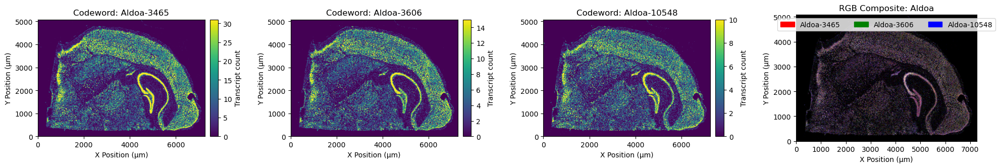

In [21]:
visualize_gene_codewords(
    gene = 'Aldoa',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=95
)

#### Xenium multi-gene RGB

In [22]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# --- Reusable Plotting Function ---
def plot_gene_rgb_on_ax(
    ax, gene, 
    gene_cwid_dict = gene_cwid_dict, 
    cw_density_dict = cw_density_dict
):
    """
    Generates and draws a single brightened RGB plot for a given gene onto a
    specific Matplotlib Axes object (subplot).
    """
    # --- 1. Data Retrieval and Selection ---
    codeword_list = gene_cwid_dict.get(gene)
    if not codeword_list:
        ax.text(0.5, 0.5, f"Gene '{gene}'\nnot found", ha='center', va='center', fontsize=12)
        ax.set_xticks([])
        ax.set_yticks([])
        return

    density_map_list = [cw_density_dict[cw].toarray() for cw in codeword_list]
    scale_factor = 20  # 20µm per index

    # Find the top 3 most expressed codewords
    total_counts = [np.sum(m) for m in density_map_list]
    top_indices = np.argsort(total_counts)[::-1][:3]

    maps_to_plot = [density_map_list[i] for i in top_indices]
    codewords_to_plot = [codeword_list[i] for i in top_indices]

    # --- 2. RGB Image Preparation ---
    height, width = maps_to_plot[0].shape
    rgb_image = np.zeros((height, width, 3))
    legend_patches = []
    gamma = 0.2 # for better contrast

    # Color mapping: 1st -> Red, 2nd -> Green, 3rd -> Blue
    color_assignment = {
        0: {'name': 'Red', 'channel': 0, 'color': 'red'},
        1: {'name': 'Green', 'channel': 1, 'color': 'green'},
        2: {'name': 'Blue', 'channel': 2, 'color': 'blue'}
    }

    for i in range(len(maps_to_plot)):
        dense_map = maps_to_plot[i]
        codeword = codewords_to_plot[i]
        assignment = color_assignment[i]
        channel_index = assignment['channel']
        
        # Normalize, apply gamma correction, and assign to channel
        max_val = np.max(dense_map)
        normalized_map = dense_map / (max_val + 1e-9)
        brightened_map = np.power(normalized_map, gamma)
        rgb_image[:, :, channel_index] = brightened_map
        
        # Use only the end of the codeword name for a cleaner legend
        short_cw_name = codeword.split('-')[-1]
        legend_patches.append(
            mpatches.Patch(color=assignment['color'], label=f"{assignment['name']}: {short_cw_name}")
        )

    # --- 3. Plotting on the provided Axes ---
    extent = [0, width * scale_factor, 0, height * scale_factor]
    ax.imshow(rgb_image, origin='lower', aspect='auto', extent=extent)
    
    # Set title and labels for the subplot
    ax.set_title(gene, fontsize=14)
    ax.set_xlabel(f"X Position ({'\u03BC'}m)")

    # Add the legend to the top of the subplot
    ax.legend(
        handles=legend_patches,
        loc='lower center',
        bbox_to_anchor=(0.5, 0), # Position legend below the plot
        ncol=len(legend_patches),
        fontsize='small'
    )

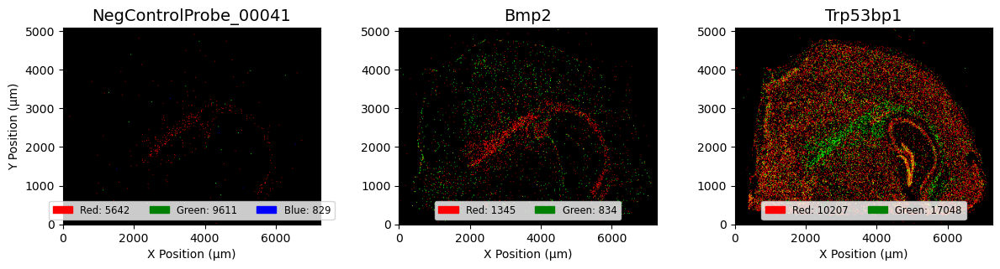

In [25]:
# Define the list of genes you want to plot
genes_to_plot = ["NegControlProbe_00041", "Bmp2", "Trp53bp1"]

# Create a figure with 1 row and 3 columns of subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 3.6))

# Loop through each subplot (ax) and gene, then plot
for i, (ax, gene) in enumerate(zip(axes, genes_to_plot)):
    # Call the plotting function for the current subplot and gene
    plot_gene_rgb_on_ax(ax, gene, gene_cwid_dict, cw_density_dict)
    
    # Only show the Y-axis label on the first plot to avoid redundancy
    if i == 0:
        ax.set_ylabel(f"Y Position ({'\u03BC'}m)")

# Adjust layout to prevent titles and legends from overlapping
plt.tight_layout(rect=[0, 0, 1, 0.92]) # rect leaves space at the top for the suptitle

# Save as pdf
plt.savefig(f"{res_dir}/figures/xenium_negprobes.pdf")

plt.show()

### Xenium cell type distribution

#### Compute per-cluster density

In [24]:
import pandas as pd
import numpy as np
import scipy.sparse
import matplotlib.pyplot as plt
import warnings

def calculate_cluster_density_maps(
    cells_file,
    clusters_file,
    reference_shape,
    bin_size_um = 20.0
):
    """
    Calculate cell type density maps for each cluster using the same binning as codeword density maps.
    """
    
    # Load cell summary data
    print("Loading cell summary data...")
    cells_df = pd.read_csv(cells_file, compression='gzip')
    
    # Load clustering results
    print("Loading clustering results...")
    clusters_df = pd.read_csv(clusters_file)
    
    # Merge dataframes
    merged_df = pd.merge(
        cells_df, 
        clusters_df, 
        left_on='cell_id', 
        right_on='Barcode', 
        how='inner'
    )
    
    print(f"Total cells with cluster assignments: {len(merged_df)}")
    
    # Infer grid dimensions from reference density maps
    # Get the shape from any density map (they should all be the same)
    nrows, ncols = reference_shape
    x_min, y_min = 0, 0
    
    # Create bins that match the codeword density grid
    # Adjust the bins to ensure they align with the reference grid
    x_bins = np.linspace(x_min, x_min + ncols * bin_size_um, ncols + 1)
    y_bins = np.linspace(y_min, y_min + nrows * bin_size_um, nrows + 1)
    
    print(f"Grid dimensions: {nrows} rows x {ncols} cols")
    print(f"Bin size: {bin_size_um} µm")
    print(f"Spatial extent: X [{x_bins[0]:.1f}, {x_bins[-1]:.1f}] µm, Y [{y_bins[0]:.1f}, {y_bins[-1]:.1f}] µm")
    
    # Calculate density for each cluster
    cluster_density_maps = {}
    cluster_ids = sorted(merged_df['Cluster'].unique())
    
    for cluster_id in cluster_ids:
        # Filter cells for this cluster
        cluster_cells = merged_df[merged_df['Cluster'] == cluster_id]
        
        if len(cluster_cells) > 0:
            # Create 2D histogram
            hist, _, _ = np.histogram2d(
                cluster_cells['x_centroid'], 
                cluster_cells['y_centroid'],
                bins=[x_bins, y_bins]
            )
            
            # Convert to sparse matrix (transpose to match codeword format: Y on rows, X on columns)
            sparse_hist = scipy.sparse.csc_matrix(hist.T)
            cluster_density_maps[cluster_id] = sparse_hist
            
            print(f"Cluster {cluster_id}: {len(cluster_cells)} cells, "
                  f"{sparse_hist.nnz} occupied bins")
        else:
            # Empty cluster
            cluster_density_maps[cluster_id] = scipy.sparse.csc_matrix((nrows, ncols))
            warnings.warn(f"Cluster {cluster_id} has no cells")
    
    return cluster_density_maps, x_bins, y_bins

In [25]:
cells_file = f"{data_dir}/outs/cells.csv.gz"
clusters_file = f"{data_dir}/outs/analysis/clustering/gene_expression_graphclust/clusters.csv"

# Calculate cluster density maps
cluster_density_dict, x_bins, y_bins = calculate_cluster_density_maps(
    cells_file,
    clusters_file,
    reference_shape=(254, 363),
    bin_size_um=20.0
)

Loading cell summary data...
Loading clustering results...
Total cells with cluster assignments: 63162
Grid dimensions: 254 rows x 363 cols
Bin size: 20.0 µm
Spatial extent: X [0.0, 7260.0] µm, Y [0.0, 5080.0] µm
Cluster 1: 6652 cells, 5770 occupied bins
Cluster 2: 5790 cells, 4901 occupied bins
Cluster 3: 5689 cells, 5340 occupied bins
Cluster 4: 5605 cells, 4451 occupied bins
Cluster 5: 5312 cells, 4598 occupied bins
Cluster 6: 4796 cells, 4530 occupied bins
Cluster 7: 2965 cells, 2607 occupied bins
Cluster 8: 2951 cells, 2574 occupied bins
Cluster 9: 2909 cells, 2181 occupied bins
Cluster 10: 2865 cells, 2305 occupied bins
Cluster 11: 2748 cells, 2379 occupied bins
Cluster 12: 2257 cells, 2169 occupied bins
Cluster 13: 1941 cells, 1763 occupied bins
Cluster 14: 1762 cells, 975 occupied bins
Cluster 15: 1566 cells, 1477 occupied bins
Cluster 16: 1467 cells, 1349 occupied bins
Cluster 17: 1347 cells, 480 occupied bins
Cluster 18: 999 cells, 929 occupied bins
Cluster 19: 704 cells, 669

#### Plot density maps for selected cell types

In [26]:
def visualize_cluster_density_maps(
    cluster_density_maps = cluster_density_dict,
    scale_factor = 20.0,
    vmax = None,
    clusters_to_plot = None,
    title = None
):
    """
    Visualize cluster density maps in the same style as codeword density visualization.
    
    Parameters:
    -----------
    cluster_density_maps : dict
        Dictionary mapping cluster IDs to sparse density matrices
    scale_factor : float
        Scale factor for axes (bin size in µm)
    vmax : float, optional
        Maximum value for color scale. If None, uses the maximum across all clusters
    clusters_to_plot : list, optional
        Specific clusters to plot. If None, plots all clusters
    title : str
        Main title for the figure
    """
    
    # Determine which clusters to plot
    if clusters_to_plot is None:
        clusters_to_plot = sorted(cluster_density_maps.keys())
    
    # Convert sparse matrices to dense for plotting
    density_map_list = []
    cluster_list = []
    
    for cluster_id in clusters_to_plot:
        if cluster_id in cluster_density_maps:
            dense_map = cluster_density_maps[cluster_id].toarray()
            density_map_list.append(dense_map)
            cluster_list.append(cluster_id)
    
    if len(density_map_list) == 0:
        print("No clusters to plot")
        return
    
    # Create figure
    n_clusters = len(density_map_list)

    # Create subplot figure for all clusters
    n_cols = min(4, n_clusters)
    n_rows = (n_clusters + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    if n_clusters == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    # fig_width = min(5 * n_clusters, 30)  # Cap maximum figure width
    # fig, axes = plt.subplots(1, n_clusters, figsize=(fig_width, 4.5), squeeze=False)
    if title is not None:
        fig.suptitle(title, fontsize=16)
    
    # Determine common vmax if not specified
    if vmax is None:
        all_densities = np.concatenate([d.flatten() for d in density_map_list])
        vmax = np.percentile(all_densities[all_densities > 0], 95)  # 95th percentile for better visualization
    
    # Plot each cluster
    for i, (ax, cluster_id, dense_map) in enumerate(zip(axes, cluster_list, density_map_list)):
        height, width = dense_map.shape
        extent = [0, width * scale_factor, 0, height * scale_factor]
        
        im = ax.imshow(dense_map, origin='lower', aspect='auto', 
                      cmap='viridis', vmax=vmax, extent=extent)
        
        # Calculate some statistics
        n_cells = int(np.sum(dense_map))
        n_occupied = np.sum(dense_map > 0)
        
        ax.set_title(f"Cluster {cluster_id}\n({n_cells} cells, {n_occupied} bins)")
        ax.set_xlabel(f"X Position (µm)")
        if i == 0:
            ax.set_ylabel(f"Y Position (µm)")
        
        cbar = fig.colorbar(im, ax=ax, label="Cell Count", shrink=0.8)

    # Hide unused subplots
    for idx in range(n_clusters, len(axes)):
        axes[idx].set_visible(False)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

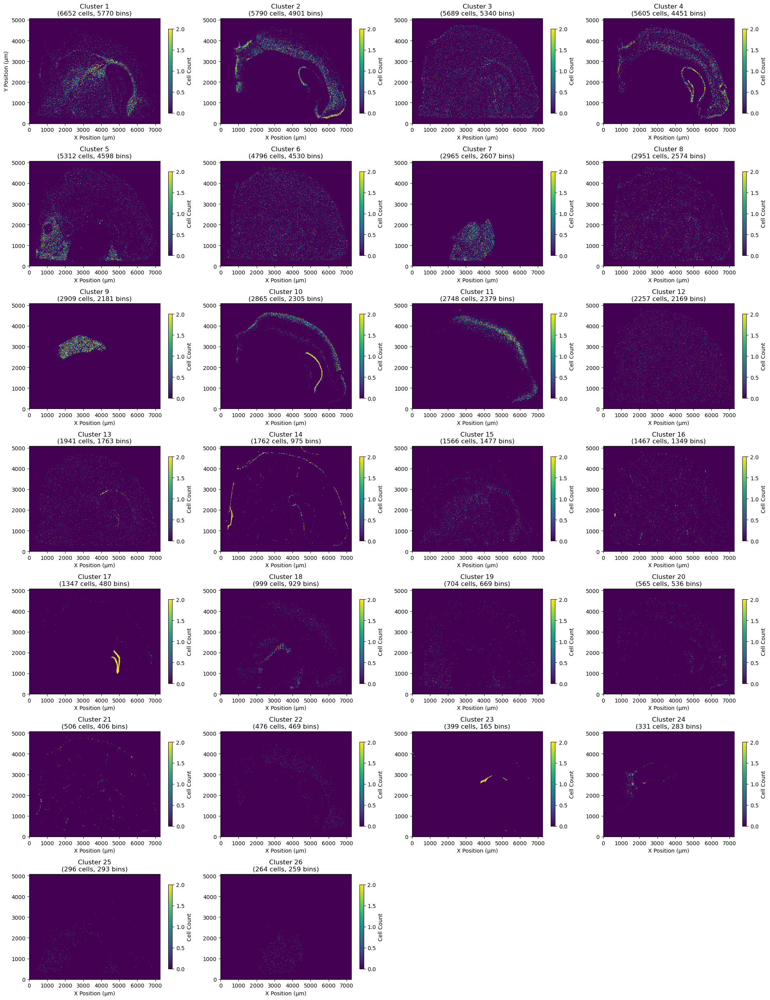

In [27]:
# Visualize all clusters
visualize_cluster_density_maps(
    cluster_density_dict,
    scale_factor=20.0,
    vmax=None
)

### Examples

#### Dtnbp1 and Nptxr+ exitatory neuron colocalization

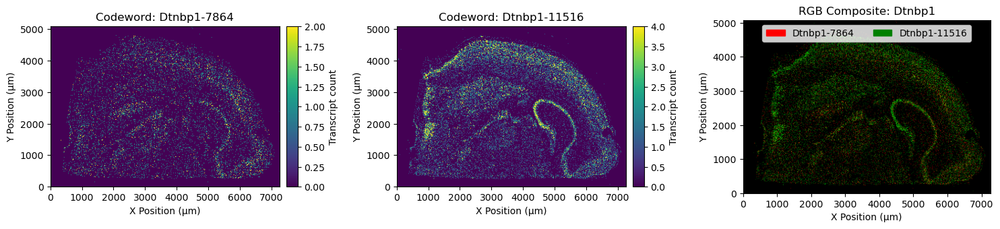

In [28]:
visualize_gene_codewords(
    gene = 'Dtnbp1',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=95
)

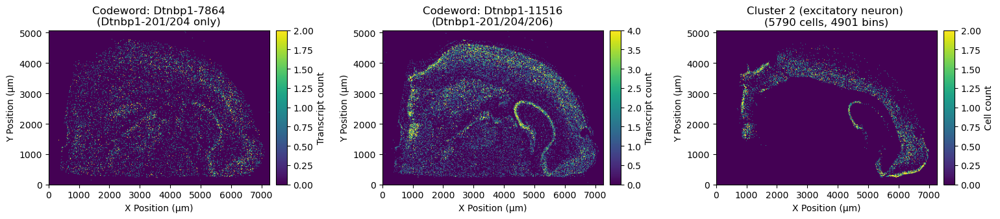

In [29]:
codeword_list = ['Dtnbp1-7864', 'Dtnbp1-11516']
codeword_title_list = ['Codeword: Dtnbp1-7864\n(Dtnbp1-201/204 only)', 
                       'Codeword: Dtnbp1-11516\n(Dtnbp1-201/204/206)']
cluster_id = 2
scale_factor = 20.0
gamma = 0.8
vmax_pct = 95

density_map_list = [cw_density_dict[cw].toarray() for cw in codeword_list]
n_codewords = len(density_map_list)

# Create figure with GridSpec for better control
fig = plt.figure(figsize=(6 * (n_codewords + 1), 6))
gs = gridspec.GridSpec(1, (n_codewords + 1), figure=fig, wspace=0.4)

axes = [fig.add_subplot(gs[i]) for i in range(n_codewords + 1)]

# Common extent for all panels
height, width = density_map_list[0].shape
extent = [0, width * scale_factor, 0, height * scale_factor]

# Store images for colorbar creation
images = []

# First n_codewords panels: Codeword density heatmaps
for i, (ax, dense_map, codeword) in enumerate(
    zip(axes[:n_codewords], density_map_list, codeword_list[:n_codewords])
):
    if vmax_pct is not None:
        vmax = np.percentile(dense_map[dense_map > 0], vmax_pct)
        im = ax.imshow(dense_map, origin='lower', aspect='equal', cmap='viridis', extent=extent, vmax = vmax)
    else:
        im = ax.imshow(dense_map, origin='lower', aspect='equal', cmap='viridis', extent=extent)

    ax.set_title(codeword_title_list[i])
    ax.set_xlabel("X Position (µm)")
    ax.set_ylabel("Y Position (µm)")
    images.append(im)

# Last Panel: Cluster density map
cluster_dense = cluster_density_dict[cluster_id].toarray()

if vmax_pct is not None:
    vmax = np.percentile(cluster_dense[cluster_dense > 0], vmax_pct)
    im = axes[-1].imshow(cluster_dense, origin='lower', aspect='equal', cmap='viridis', extent=extent, vmax = vmax)
else:
    im = axes[-1].imshow(cluster_dense, origin='lower', aspect='equal', cmap='viridis', extent=extent)

n_cells = int(np.sum(cluster_dense))
n_bins = np.sum(cluster_dense > 0)
axes[-1].set_title(f"Cluster {cluster_id} (excitatory neuron) \n({n_cells} cells, {n_bins} bins)")
axes[-1].set_xlabel("X Position (µm)")
axes[-1].set_ylabel("Y Position (µm)")
images.append(im)

# Add colorbars to first panels with consistent positioning
for i, (ax, im) in enumerate(zip(axes, images)):
    # Create colorbar with same width as the RGB panel's legend area
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    if i == n_codewords:
        plt.colorbar(im, cax=cax, label="Cell count")
    else:
        plt.colorbar(im, cax=cax, label="Transcript count")

plt.show()

In [58]:
from splisosm.utils import false_discovery_control

gene = 'Dtnbp1'
codeword_list = ['Dtnbp1-7864', 'Dtnbp1-11516']
cluster_id = 2
# cluster_id = 10

# Compute codeword-stratified cluster 2 subpopulation marker genes
cw1_dense = cw_density_dict[codeword_list[0]].toarray()
cw2_dense = cw_density_dict[codeword_list[1]].toarray()
cluster_dense = cluster_density_dict[cluster_id].toarray()

cw2_only = (cw2_dense > 0) & (cw1_dense == 0)
has_cluster = cluster_dense > 0

# bin indices
cw2_clu2 = cw2_only & has_cluster # 11516-only bins
cw1_clu2 = (~cw2_only) & has_cluster

# Differential expression analysis
de_dtnbp1 = []
for cw in cw_density_dict.keys():
    d = cw_density_dict[cw]
    mean1 = d.toarray()[cw2_clu2].mean()
    mean2 = d.toarray()[cw1_clu2].mean()
    pval = scipy.stats.ttest_ind(
        d.toarray()[cw2_clu2],
        d.toarray()[cw1_clu2]
    ).pvalue
    log2fc = np.log2((mean1 + 1e-5) / (mean2 + 1e-5))
    de_dtnbp1.append({
        'codeword': cw,
        'gene': cw.split('-')[0],
        'mean1': mean1,
        'mean2': mean2,
        'pval': pval,
        'log2fc': log2fc
    })

de_dtnbp1 = pd.DataFrame(de_dtnbp1)
de_dtnbp1['padj'] = false_discovery_control(de_dtnbp1['pval'])

/Users/jysumac/miniforge3/envs/splisosm/lib/python3.12/site-packages/splisosm/utils.py:176: UserWarning: NaNs encountered in p-values. These will be ignored.


In [59]:
def _volcano(logfc, pvals, genes, ax, pval_thresh = 0.05, fc_thresh = 0.5, n_top_genes = 5):
    """Volcano plot showing differential expression results"""
    neg_log_pvals = -np.log10(pvals + 1e-30)
    nlp_thresh = -np.log10(pval_thresh)
    
    colors = ['gray' if nlp <= nlp_thresh or abs(fc) <= fc_thresh
              else ('red' if fc > 0 else 'blue')
              for fc, nlp in zip(logfc, neg_log_pvals)]
    
    ax.scatter(logfc, neg_log_pvals, c=colors, alpha=0.6, s=20)
    ax.axhline(y=nlp_thresh, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=fc_thresh, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-fc_thresh, color='black', linestyle='--', alpha=0.5)

    # Label top DE genes
    # Filter for positive significant genes
    sig_mask = (pvals < pval_thresh) & (logfc > fc_thresh)
    
    if np.any(sig_mask):
        # Get indices of top genes by logfc
        de_score = np.abs(logfc)
        de_score[~sig_mask] = -np.inf  # Exclude non-significant genes
        top_indices = np.argsort(de_score)[-n_top_genes:][::-1]
        
        # Plot labels for top genes
        texts = []
        for idx in top_indices:
            if de_score[idx] > -np.inf:  # Only plot if it's a valid significant gene
                # Add text label
                txt = ax.annotate(
                    genes[idx], 
                    xy=(logfc[idx], neg_log_pvals[idx]),
                    xytext=(5, 5), 
                    textcoords='offset points',
                    fontsize=12,
                    arrowprops=dict(
                        arrowstyle='->',
                        alpha=0.5,
                        lw=0.5
                    )
                )
                texts.append(txt)

    # Adjust text positions to minimize overlap
    if texts:
        try:
            from adjustText import adjust_text
            adjust_text(
                texts, ax=ax, 
                arrowprops=dict(
                    arrowstyle='->',
                    alpha=0.5,
                    lw=0.5
                ),
                # max_move=1
            )
        except:
            # If adjustText is not available, labels may overlap
            pass

    ax.set_xlabel('Log2 Fold Change')
    ax.set_ylabel('-Log10(Adjusted p-value)')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-2, 2)

    return None

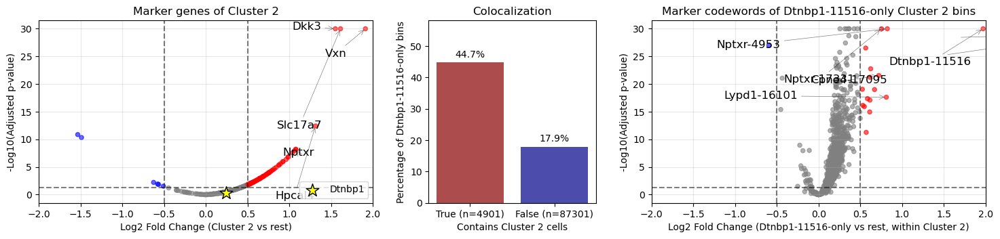

In [60]:
# Create figure with custom width ratios
fig = plt.figure(figsize=(18, 3.5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1.2, 0.6, 1.2], wspace=0.2)

# Load precomputed DE results
df = pd.read_csv(
    f'{data_dir}/outs/analysis/diffexp/gene_expression_graphclust/differential_expression.csv'
)
# Filter out Mean Counts <= 1.0 genes but keep Dtnbp1
de_clu = df.loc[
    (df[f'Cluster {cluster_id} Mean Counts'] > 1.0) | (df['Feature Name'] == 'Dtnbp1')
]

# Panel 1: Volcano plot of Cluster 2 marker gene
ax1 = fig.add_subplot(gs[0])
logfc = de_clu[f'Cluster {cluster_id} Log2 fold change'].values
pvals = de_clu[f'Cluster {cluster_id} Adjusted p value'].values
genes = de_clu['Feature Name'].values
_volcano(logfc, pvals, genes, ax1)

# Highlight the target gene
ax1.scatter(
    logfc[np.where(genes == 'Dtnbp1')[0][0]], 
    pvals[np.where(genes == 'Dtnbp1')[0][0]],
    color='yellow', s=200, 
    marker='*', edgecolors='black', linewidth=1, label=gene, zorder=10
)
ax1.legend(loc='lower right')
ax1.set_title(f'Marker genes of Cluster {cluster_id}')
ax1.set_xlabel('Log2 Fold Change (Cluster 2 vs rest)')

# Panel 2: Bar plot
ax2 = fig.add_subplot(gs[1])

bins_with = np.sum(has_cluster)
bins_without = np.sum(~has_cluster)

pct_with = np.sum(cw2_only & has_cluster) / bins_with * 100 if bins_with > 0 else 0
pct_without = np.sum(cw2_only & ~has_cluster) / bins_without * 100 if bins_without > 0 else 0

bars = ax2.bar([f'True (n={bins_with})', f'False (n={bins_without})'], [pct_with, pct_without], 
                color=['darkred', 'darkblue'], alpha=0.7)

for bar, pct in zip(bars, [pct_with, pct_without]):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f'{pct:.1f}%', ha='center', va='bottom')

ax2.set_xlabel('Contains Cluster 2 cells')
ax2.set_ylabel(f'Percentage of {codeword_list[1]}-only bins')
ax2.set_title('Colocalization')
ax2.set_ylim(0, max(pct_with, pct_without) * 1.3)

# Panel 3: Volcano plot of Dtnbp1-11516 subcluster marker gene
ax3 = fig.add_subplot(gs[2])
de_subclu = de_dtnbp1.loc[(de_dtnbp1['mean1'] > 1.0)]
logfc = de_subclu['log2fc'].values
pvals = de_subclu['padj'].values
genes = de_subclu['codeword'].values
# genes = de_subclu['gene'].values
_volcano(logfc, pvals, genes, ax3)
ax3.set_title(f'Marker codewords of Dtnbp1-11516-only Cluster 2 bins')
ax3.set_xlabel('Log2 Fold Change (Dtnbp1-11516-only vs rest, within Cluster 2)')

plt.show()

#### Zdhhc8

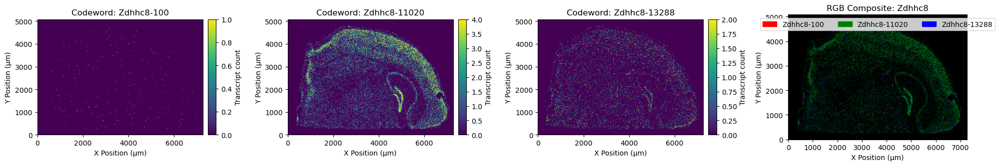

In [34]:
visualize_gene_codewords(
    gene = 'Zdhhc8',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=95
)

In [35]:
# need a different transcriptome reference 
# Load and parse reference GTF
refseq_gtf_file="/Users/jysumac/reference/mm10/mm10.ncbiRefSeq.gtf"
gtf_refseq_data = []
with open(refseq_gtf_file, 'r') as f:
    for line in f:
        if line.startswith('#'):
            continue
        fields = line.strip().split('\t')
        if len(fields) >= 9:
            attrs = parse_gtf_attributes(fields[8])
            gtf_refseq_data.append({
                'chrom': fields[0],
                'source': fields[1],
                'feature': fields[2],
                'start': int(fields[3]),
                'end': int(fields[4]),
                'strand': fields[6],
                'gene_name': attrs.get('gene_name', ''),
                'transcript_id': attrs.get('transcript_id', ''),
                'transcript_name': attrs.get('transcript_name', ''),
                'gene_id': attrs.get('gene_id', '')
            })

gtf_refseq_data = pd.DataFrame(gtf_refseq_data)
gtf_refseq_data['transcript_name'] = gtf_refseq_data['transcript_id']

In [36]:
# For static matplotlib visualization
create_xenium_static_widget(
    xenium_bed = bed_xenium,
    selected_region_bed = bed_sr_sv_peak,
    selected_iso_gtf = gtf_ont_sv,
    reference_gtf = gtf_refseq_data
)

#### Other examples of "false negatives"

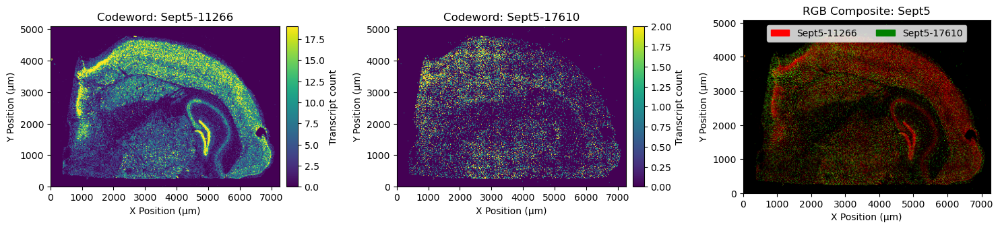

In [37]:
visualize_gene_codewords(
    gene = 'Sept5',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=95
)

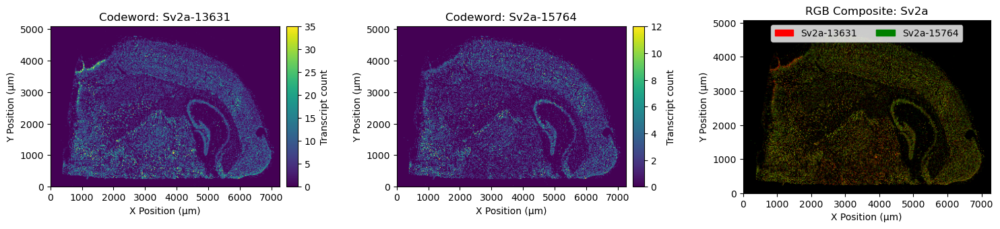

In [38]:
visualize_gene_codewords(
    gene = 'Sv2a',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=99.9
)

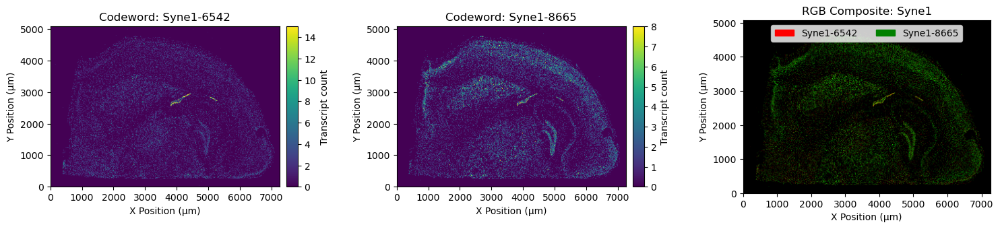

In [39]:
visualize_gene_codewords(
    gene = 'Syne1',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=99.9
)

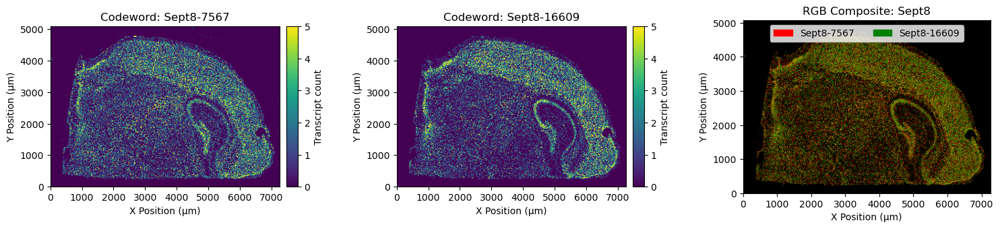

In [40]:
visualize_gene_codewords(
    gene = 'Sept8',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.5,
    vmax_pct=95
)

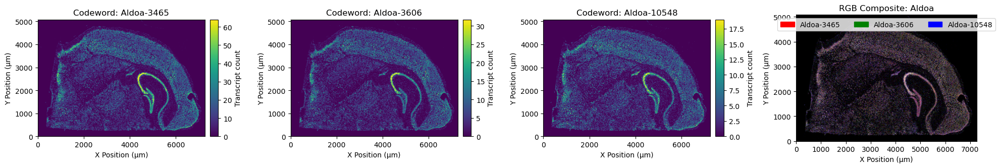

In [41]:
visualize_gene_codewords(
    gene = 'Aldoa',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.8,
    vmax_pct=99.9
)

#### Selected cell types

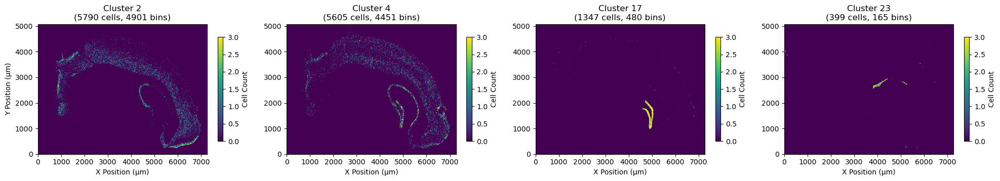

In [42]:
# Visualize specific clusters
visualize_cluster_density_maps(
    cluster_density_dict,
    scale_factor=20.0,
    clusters_to_plot=[2, 4, 17, 23]
)

#### Other Xenium-only hits

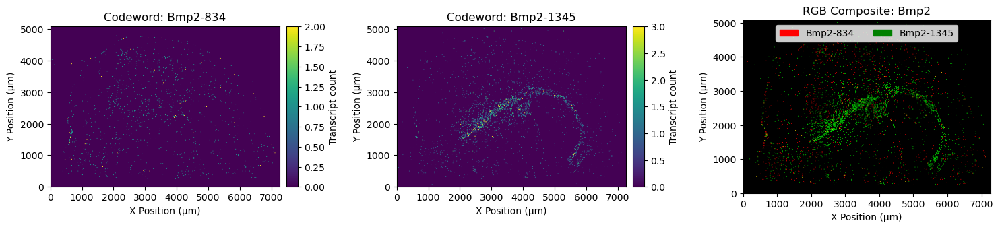

In [43]:
visualize_gene_codewords(
    gene = 'Bmp2',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

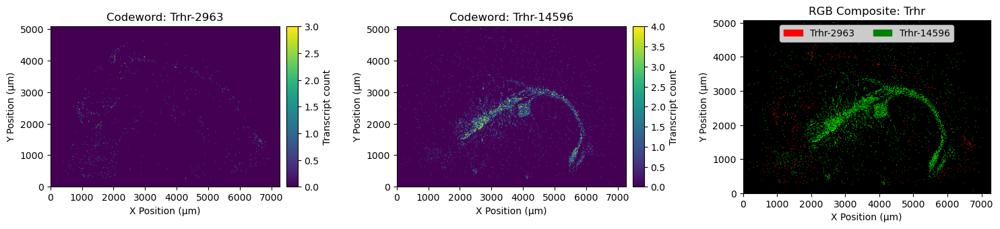

In [44]:
visualize_gene_codewords(
    gene = 'Trhr',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

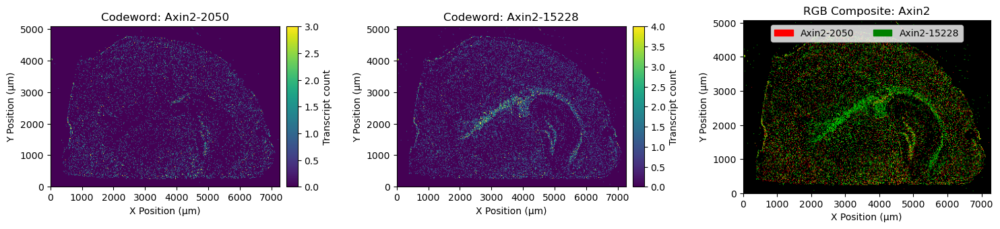

In [45]:
visualize_gene_codewords(
    gene = 'Axin2',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

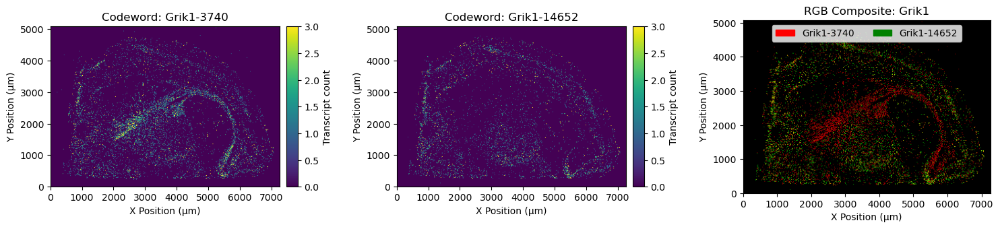

In [46]:
visualize_gene_codewords(
    gene = 'Grik1',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=95
)

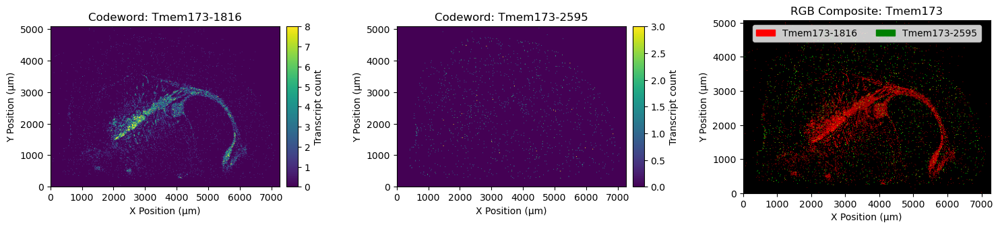

In [47]:
visualize_gene_codewords(
    gene = 'Tmem173',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

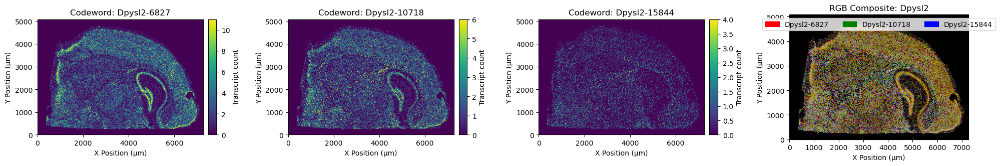

In [48]:
visualize_gene_codewords(
    gene = 'Dpysl2',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

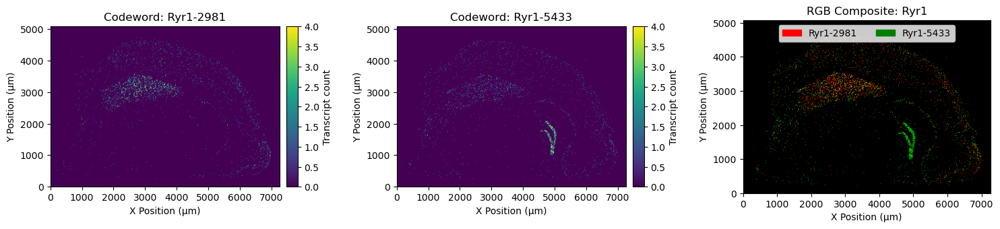

In [49]:
visualize_gene_codewords(
    gene = 'Ryr1',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

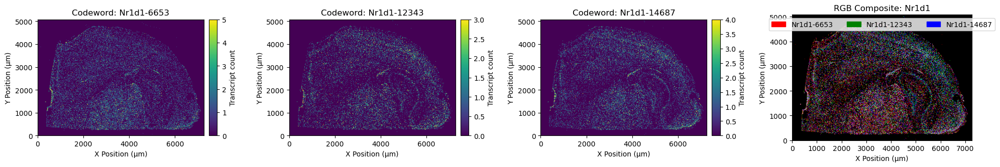

In [50]:
visualize_gene_codewords(
    gene = 'Nr1d1',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

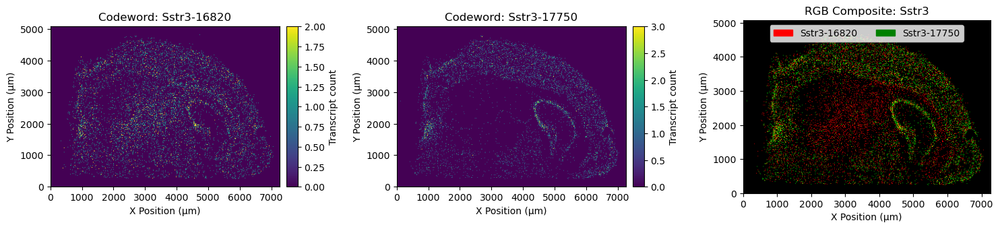

In [51]:
visualize_gene_codewords(
    gene = 'Sstr3',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.3,
    vmax_pct=99
)

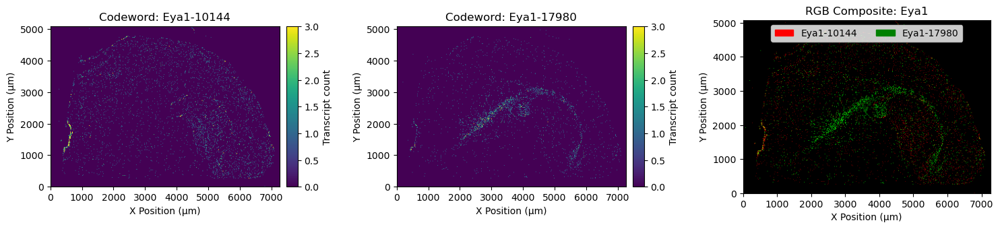

In [52]:
visualize_gene_codewords(
    gene = 'Eya1',
    density_maps = cw_density_dict,
    gene_cwid_dict = gene_cwid_dict,
    scale_factor = 20.0,
    gamma = 0.5,
    vmax_pct=99
)

In [53]:
len(cw_density_dict), cw_density_dict['Eya1-10144'].shape

(10476, (254, 363))

In [54]:
len(gene_cwid_dict)

4993